In [13]:
import os
import sys
from pathlib import Path
import anndata as ad
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import style
style.use('seaborn-white')

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [14]:
import sys
sys.path.insert(0, "D:/00ScienceStudy/Biology/Spateo/spateo-release")
import spateo as st
import pyvista as pv

In [15]:
sample_id, anno_key, spatial_key = "E85", "tissue_type", "aligned_3D_spatial"
Embryo = ad.read(f"./data/E8_1_small.h5ad")
Embryo = Embryo[Embryo.obs[anno_key] != "unknown", :]
Embryo

View of AnnData object with n_obs × n_vars = 82011 × 1
    obs: 'predicted.id', 'tissue_type', 'cell_type'
    obsm: '2D_spatial', 'X_pca', 'X_spatial', 'X_spatial_registered', 'X_umap', 'align_spatial', 'align_spatial_nonrigid', 'align_spatial_rigid', 'aligned_3D_spatial', 'old_3D_spatial'

In [16]:
# for E9.0
# Embryo.obsm[spatial_key][:, 2] = Embryo.obsm[spatial_key][:, 2] * 2 / 3

In [17]:
mapping = {
    "0": "Extraembryonic ectoderm 1",
    "1": "Anterior neuroectoderm",
    "10": "Preplacodal ectoderm",
    "11": "Posterior neuroectoderm",
    "12": "Lateral plate mesoderm",
    "13": "Hematopoietic progenitors",
    "14": "Parietal endoderm",
    "15": "Amnion mesoderm early",
    "16": "Surface ectoderm",
    "18": "Somites",
    "2": "Primitive streak late",
    "20": "Splanchnic mesoderm",
    "21": "Heart",
    "22": "Primitive blood late",
    "23": "Notochord",
    "24": "Brain",
    "25": "Extraembryonic ectoderm 2",
    "26": "Neuromesodermal Progenitors (NMPs)",
    "27": "Primordial germ cells (PGCs)",
    "28": "Differentiated trophoblast cells",
    "29": "Visceral endoderm early",
    "30": "Presomitic mesoderm (PSM)",
    "31": "Neuromesodermal Progenitors (NMPs)",
    "32": "Angioblasts",
    "33": "Neural crest",
    "34": "Pharyngeal arch",
    "35": "Mesenchyme",
    "36": "Primitive blood progenitors",
    "38": "Node",
    "39": "Neural tube",
    "4": "Primitive and definitive endoderm",
    "40": "Visceral endoderm late",
    "41": "Amnion mesoderm late",
    "5": "Allantois",
    "6": "Secondary heart field (SHF)",
    "7": "Gut",
    "9": "Primitive blood early"
}

color_map_tissues = {
    1: [0, 0, 0],
    11: [0, 0, 0],
    26: [0, 0, 0],
    5: [0.7411764705882353, 0.803921568627451, 1.0],
    6: [0.19607843137254902, 0.35294117647058826, 0.6078431372549019],
    7: [0.996078431372549, 0.6862745098039216, 0.08627450980392157],
    9: [0.7686274509803922, 0.27058823529411763, 0.10980392156862745],
    10: [0.10980392156862745, 1.0, 0.807843137254902],
    12: [0.7529411764705882, 0.4588235294117647, 0.6509803921568628],
    13: [0.9647058823529412, 0.13333333333333333, 0.1803921568627451],
    14: [0.7411764705882353, 0.43529411764705883, 0.6705882352941176],
    15: [0.9686274509803922, 0.8823529411764706, 0.6274509803921569],
    16: [1.0, 0.9803921568627451, 0.9803921568627451],
    18: [0.47058823529411764, 0.16470588235294117, 0.7137254901960784],
    20: [0.5019607843137255, 0.5019607843137255, 0.5019607843137255],
    21: [0.19607843137254902, 0.5137254901960784, 0.996078431372549],
    22: [0.5098039215686274, 0.1803921568627451, 0.10980392156862745],
    23: [0.5215686274509804, 0.4, 0.050980392156862744],
    24: [0.803921568627451, 0.1607843137254902, 0.5647058823529412],
    27: [0.6588235294117647, 0.6588235294117647, 0.6588235294117647],
    29: [0.0, 0.0, 0.5450980392156862],
    30: [0.5450980392156862, 0.2784313725490196, 0.36470588235294116],
    31: [1.0, 0.7568627450980392, 0.1450980392156863],
    32: [0.8705882352941177, 0.6274509803921569, 0.9921568627450981],
    33: [0.9803921568627451, 0.0, 0.5294117647058824],
    34: [0.9725490196078431, 0.6313725490196078, 0.6235294117647059],
    35: [0.7098039215686275, 0.9372549019607843, 0.7098039215686275],
    36: [0.1803921568627451, 0.8509803921568627, 1.0],
    39: [0.10980392156862745, 0.5137254901960784, 0.33725490196078434],
    40: [1.0, 0.6470588235294118, 0.30980392156862746],
    41: [0.8470588235294118, 0.7490196078431373, 0.8470588235294118],
}

In [18]:
color_map = {}
for k, v in color_map_tissues.items():
    new_k = mapping[str(k)]
    color_map[new_k] = v
color_map['Heart'] = np.array([250,0,0]) / 255

In [19]:
import pyvista as pv
jiajun_pc = pv.read('./data/feichen_embryo/h5ad/Mouse_E8_1_feichen_pc_model.vtk')
jiajun_mesh = pv.read('./data/feichen_embryo/h5ad/Mouse_E8_1_feichen_mesh_model.vtk')

In [20]:
Embryo_clip = Embryo[Embryo.obs_names.isin(jiajun_pc['obs_index'])]
Embryo_clip.obsm[spatial_key] = jiajun_pc.points
embryo_align_pc, _ = st.tdr.construct_pc(
    adata=Embryo_clip,
    spatial_key="aligned_3D_spatial",
    groupby="tissue_type",
    key_added="cell_type",
    colormap=color_map,
)

In [11]:
mesh_model = pv.read('./data/feichen_embryo/h5ad/Mouse_E8_1_feichen_mesh_model.vtk')
# new_pc_model = pv.read('./data/feichen_embryo/h5ad/Mouse_E8_1_feichen_pc_model.vtk')

In [29]:
cpo1, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([mesh_model, embryo_align_pc]), 
    key="cell_type",
    model_style=["surface", "points"], 
    opacity=[0.4, 1],
    model_size=4,
    jupyter=False,
    window_size=(500, 500),
    ambient=0.5,
    cpo='xy',
    background='white',
    show_outline=False,
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



In [31]:
cpo1 = [(51.25936900098304, 19.194222817059085, 5045.574792222276),
 (51.25936900098304, 19.194222817059085, 203.3775815380311),
 (0.0, 1.0, 0.0)]

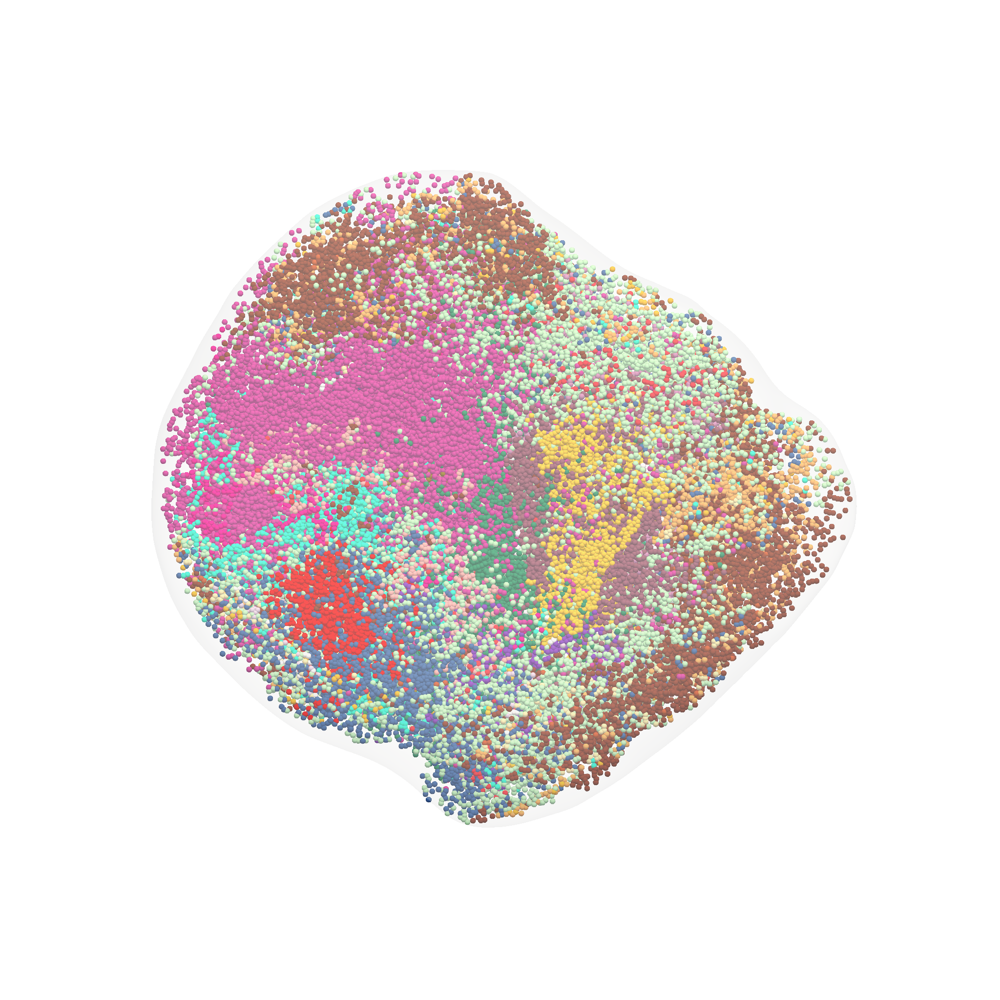

In [32]:
pv.global_theme.transparent_background = True
input_image_path = f"Spateo_E8_1_v1_with_mesh_update.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([embryo_align_pc, mesh_model]), 
    key=anno_key,
    model_style=["points", "surface"],
    model_size=12,
    opacity=[1, 0.3],
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo1,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)

In [58]:
cpo2, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([mesh_model, embryo_align_pc]), 
    key="cell_type",
    model_style=["surface", "points"], 
    opacity=[0.4, 1],
    model_size=4,
    jupyter=False,
    window_size=(500, 500),
    ambient=0.5,
    cpo='xy',
    background='white',
    show_outline=False,
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



In [35]:
cpo2 = [(-4028.5891841498615, -1387.7375908137844, -1992.5851873415183),
 (51.25936900098304, 19.194222817059085, 203.3775815380311),
 (-0.2642157778130135, 0.9567073170125643, -0.12207019427069375)]

[(-3832.228776405502, 1216.6214245684052, -2429.4083475021357),
 (51.25936900098304, 19.194222817059085, 203.3775815380311),
 (0.20609388928074746, 0.9689384482534174, 0.1366879376440908)]

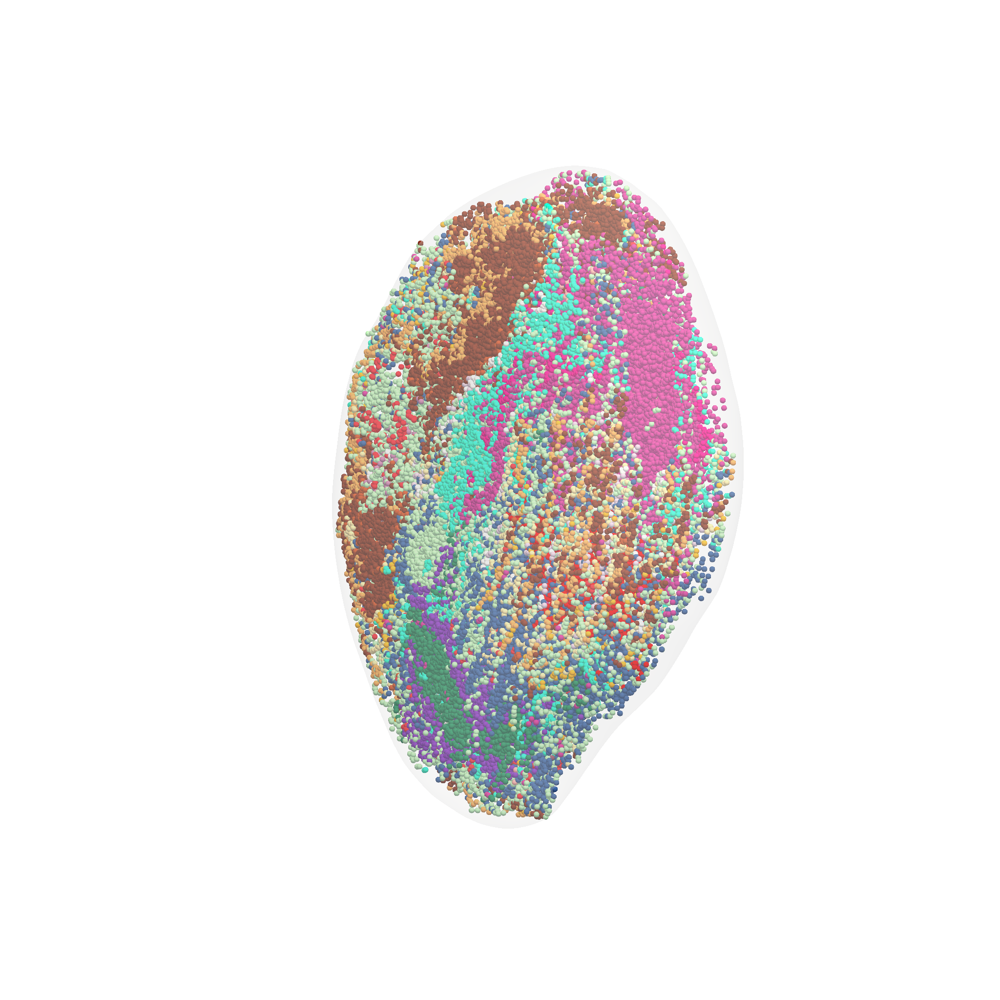

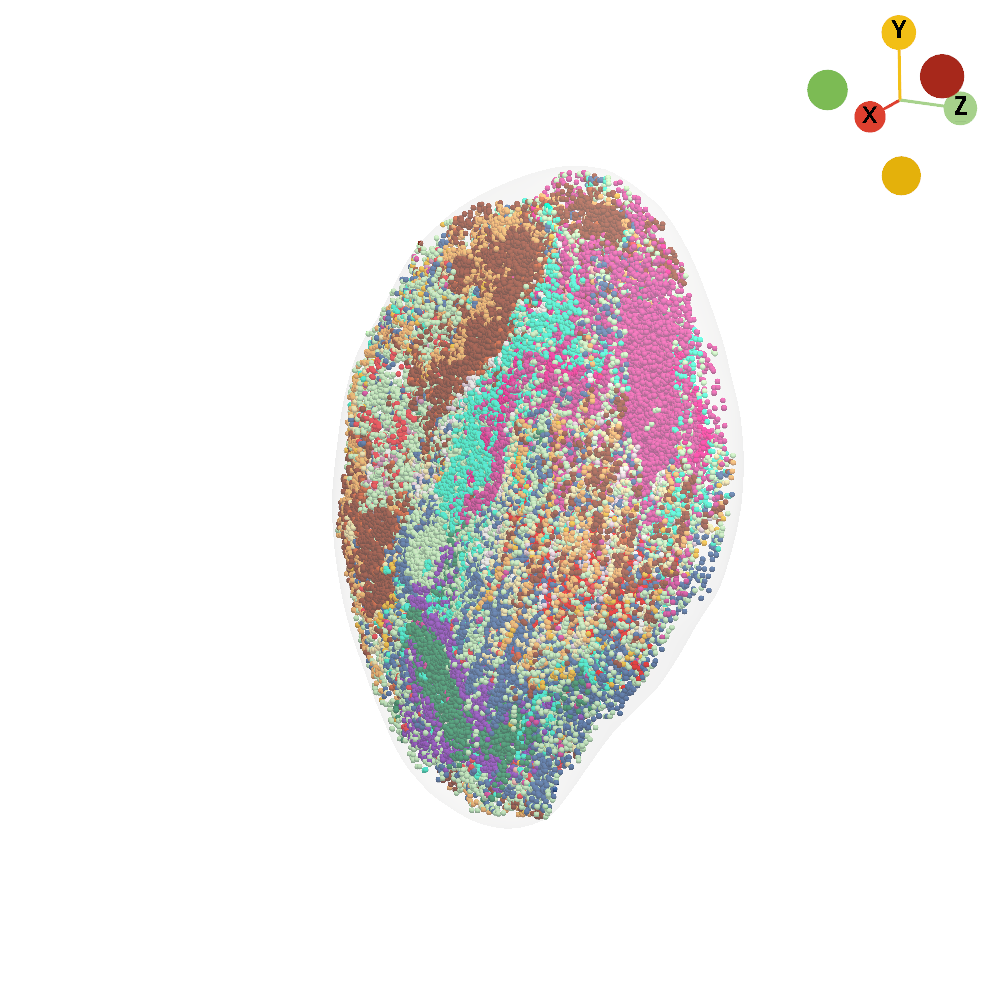

In [60]:
pv.global_theme.transparent_background = True
input_image_path = f"Spateo_E8_1_v2_with_mesh_update.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([embryo_align_pc, mesh_model]), 
    key=anno_key,
    model_style=["points", "surface"],
    model_size=12,
    opacity=[1, 0.3],
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo2,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)
pv.global_theme.transparent_background = True
input_image_path = f"Spateo_E8_1_v2_with_mesh_update_with_axes.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([embryo_align_pc, mesh_model]), 
    key=anno_key,
    model_style=["points", "surface"],
    model_size=6,
    opacity=[1, 0.3],
    show_legend=False,
    show_axes=True,
    jupyter="static",
    cpo=cpo2,
    ambient=0.3,
    window_size=(1000, 1000),
    filename=os.path.join(figure_folder, input_image_path)
)

In [62]:
cpo3, _ = st.pl.three_d_plot(
    model=st.tdr.collect_models([mesh_model, embryo_align_pc]), 
    key="cell_type",
    model_style=["surface", "points"], 
    opacity=[0.4, 1],
    model_size=4,
    jupyter=False,
    window_size=(500, 500),
    ambient=0.5,
    cpo='xy',
    background='white',
    show_outline=False,
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



In [38]:
cpo3=[(3941.9469612715066, 1878.858477167863, -1999.137514346983),
 (51.25936900098304, 19.194222817059085, 203.3775815380311),
 (-0.3391255969871526, 0.923264561981165, 0.1804892740797494)]

[(2743.934601227838, -3743.6208899656776, -1224.066409630813),
 (51.25936900098304, 19.194222817059085, 203.3775815380311),
 (0.1462882466681255, -0.25763935968681956, 0.9551029835713692)]

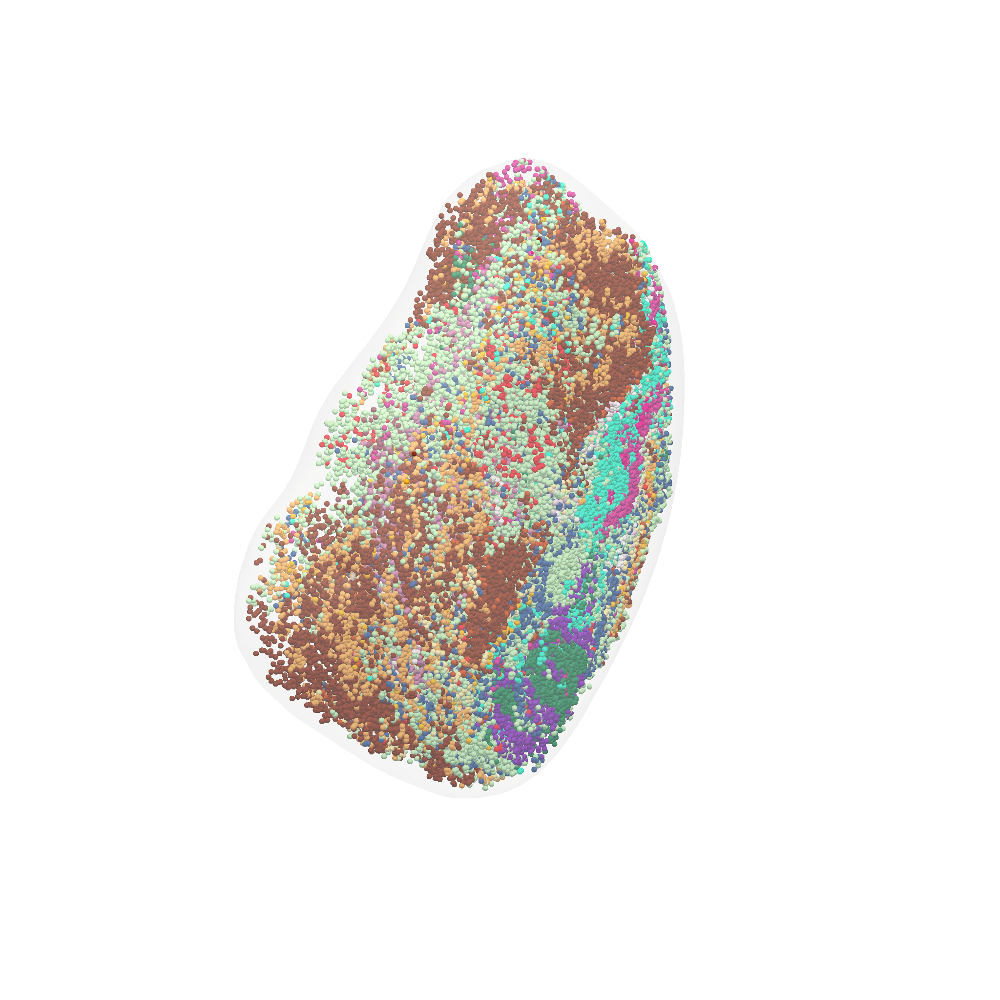

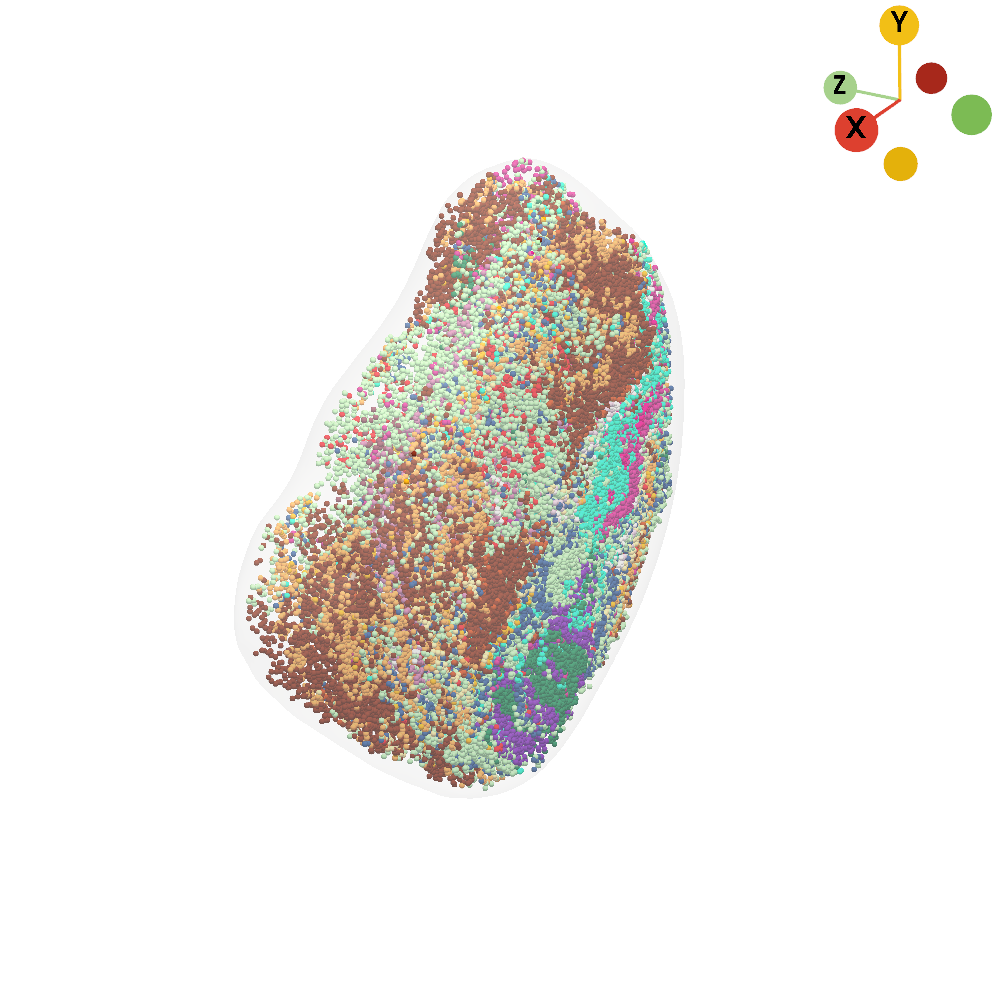

In [42]:
pv.global_theme.transparent_background = True
input_image_path = f"Spateo_E8_1_v3_with_mesh_update.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([embryo_align_pc, mesh_model]), 
    key=anno_key,
    model_style=["points", "surface"],
    model_size=12,
    opacity=[1, 0.3],
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo3,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)
pv.global_theme.transparent_background = True
input_image_path = f"Spateo_E8_1_v3_with_mesh_update_with_axes.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=st.tdr.collect_models([embryo_align_pc, mesh_model]), 
    key=anno_key,
    model_style=["points", "surface"],
    model_size=6,
    opacity=[1, 0.3],
    show_legend=False,
    show_axes=True,
    jupyter="static",
    cpo=cpo3,
    ambient=0.3,
    window_size=(1000, 1000),
    filename=os.path.join(figure_folder, input_image_path)
)

## sc3D Methods

In [53]:
embryo_pc_sc3d, _ = st.tdr.construct_pc(
    adata=Embryo_clip,
    spatial_key="old_3D_spatial",
    groupby="tissue_type",
    key_added="cell_type",
    colormap=color_map,
)

In [45]:
cpo1_sc3d, _ = st.pl.three_d_plot(
    model=embryo_pc_sc3d, 
    key="cell_type",
    model_style="points", 
    opacity=1,
    model_size=4,
    jupyter=False,
    window_size=(500, 500),
    ambient=0.5,
    cpo='xy',
    background='white',
    show_outline=False,
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



In [46]:
cpo1_sc3d = [(89.68409339550307, 386.805868218148, -4773.064991594843),
 (-78.57609334733047, -64.29537957847253, 180.0),
 (-0.3938941538108969, -0.9140624517219075, -0.0966293430885941)]

[(89.68409339550307, 386.805868218148, -4773.064991594843),
 (-78.57609334733047, -64.29537957847253, 180.0),
 (-0.3938941538108969, -0.9140624517219075, -0.0966293430885941)]

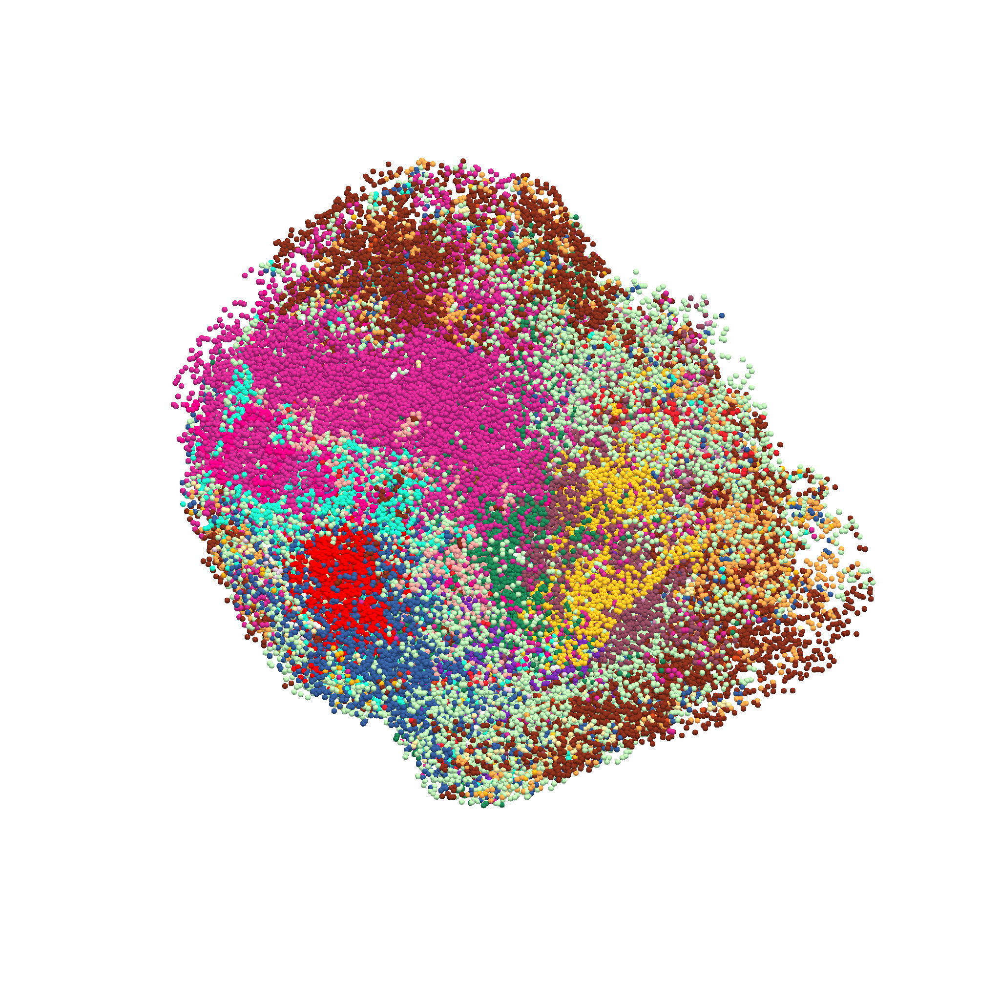

In [54]:
pv.global_theme.transparent_background = True
input_image_path = f"sc3D_E8_1_v1_with_mesh_update.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=embryo_pc_sc3d, 
    key=anno_key,
    model_style="points",
    model_size=12,
    opacity=1,
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo1_sc3d,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)

In [61]:
cpo2_sc3d, _ = st.pl.three_d_plot(
    model=embryo_pc_sc3d, 
    key="cell_type",
    model_style="points", 
    opacity=1,
    model_size=4,
    jupyter=False,
    window_size=(500, 500),
    ambient=0.5,
    cpo='xy',
    background='white',
    show_outline=False,
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



In [51]:
cpo2_sc3d = [(-2875.547369325375, 3026.3956872961735, 2898.315111914855),
 (-78.57609334733047, -64.29537957847253, 180.0),
 (-0.7209988281809242, -0.6915135637207397, 0.04438108777369965)]

[(-2875.547369325375, 3026.3956872961735, 2898.315111914855),
 (-78.57609334733047, -64.29537957847253, 180.0),
 (-0.7209988281809242, -0.6915135637207397, 0.04438108777369965)]

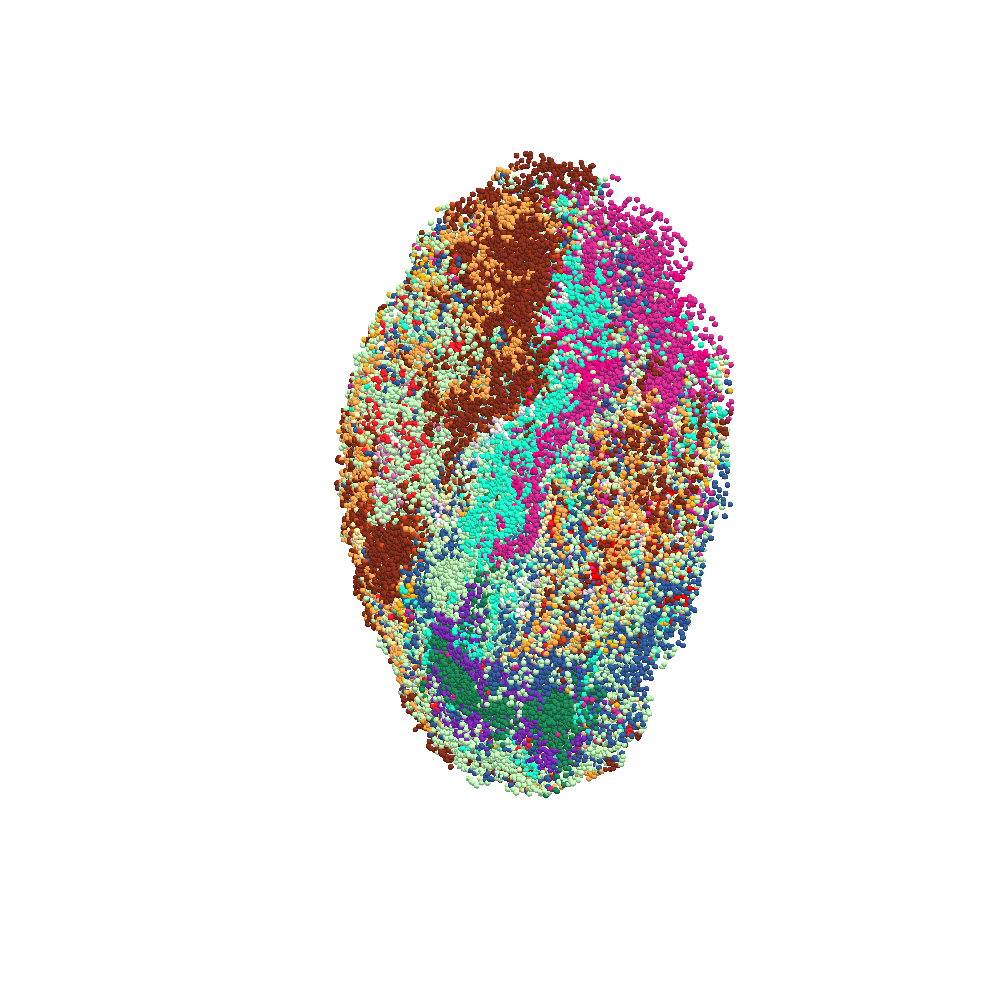

In [55]:
pv.global_theme.transparent_background = True
input_image_path = f"sc3D_E8_1_v2_with_mesh_update.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=embryo_pc_sc3d, 
    key=anno_key,
    model_style="points",
    model_size=12,
    opacity=1,
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo2_sc3d,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)

In [56]:
cpo3_sc3d, _ = st.pl.three_d_plot(
    model=embryo_pc_sc3d, 
    key="cell_type",
    model_style="points", 
    opacity=1,
    model_size=4,
    jupyter=False,
    window_size=(500, 500),
    ambient=0.5,
    cpo='xy',
    background='white',
    show_outline=False,
    show_axes=True,
)

d:\Anaconda\envs\Spateo\lib\site-packages\pyvista\plotting\plotter.py:6665: UserWarning:

Not within a jupyter notebook environment.
Ignoring ``jupyter_backend``.



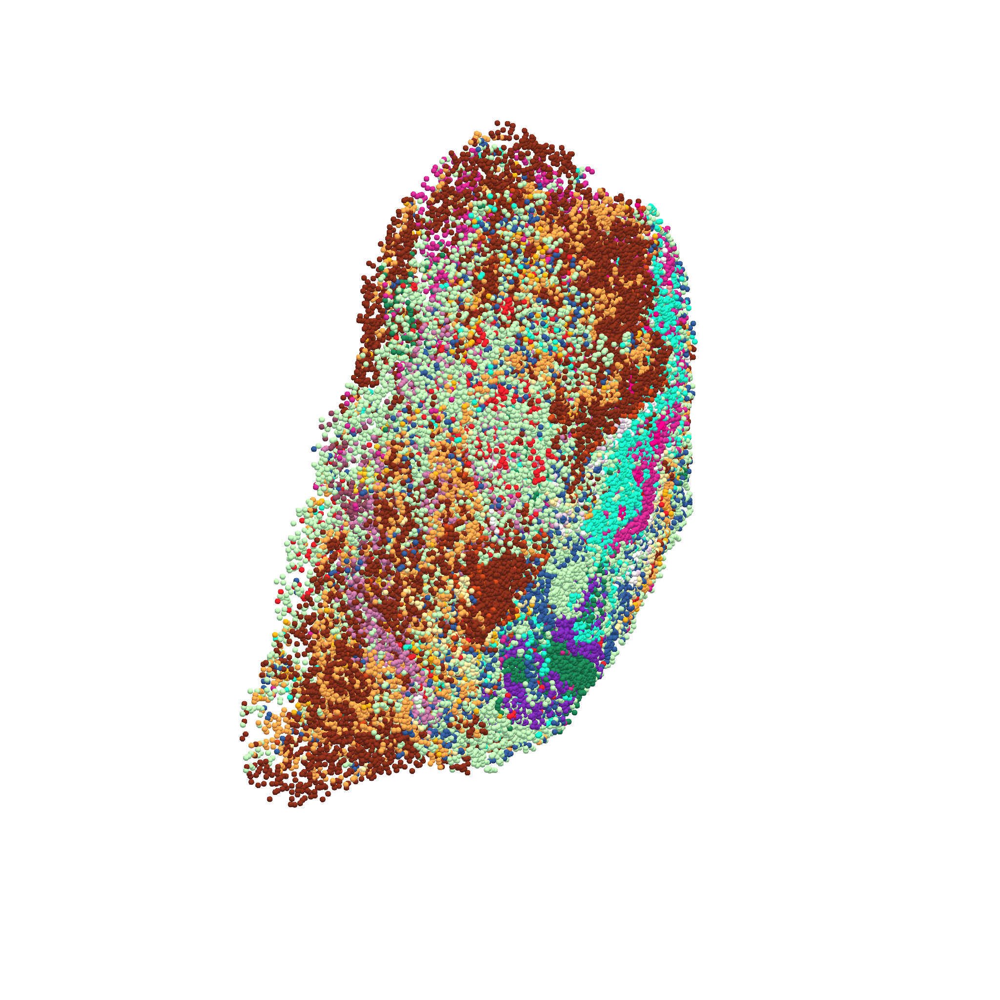

In [57]:
pv.global_theme.transparent_background = True
input_image_path = f"sc3D_E8_1_v3_with_mesh_update.tiff"
figure_folder = 'D:/00ScienceStudy/Biology/Spateo/Figure_design/Fig2_suppl_new/images/'
st.pl.three_d_plot(
    model=embryo_pc_sc3d, 
    key=anno_key,
    model_style="points",
    model_size=12,
    opacity=1,
    show_legend=False,
    show_axes=False,
    jupyter="static",
    cpo=cpo3_sc3d,
    ambient=0.3,
    window_size=(2048, 2048),
    filename=os.path.join(figure_folder, input_image_path)
)